# Data Structures

In [1]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

In [26]:
us = gpd.read_file(r"C:\Users\wtdud\Geopandas\TN.gdb\county.shp")

In [27]:
pd.set_option("display.max_rows", 5)
us

,NAME,STATE_NAME,STATE_FIPS,CNTY_FIPS,FIPS,AREA,POP1990,POP1999,POP90_SQMI,HOUSEHOLDS,...,UNITS2,UNITS3_9,UNITS10_49,UNITS50_UP,MOBILEHOME,NO_FARMS87,AVG_SIZE87,CROP_ACR87,AVG_SALE87,geometry
0,Lake of the Woods,Minnesota,27,077,27077,1784.0634,4076,4597,2,1576,...,24,29,80,0,937,222,536,83787,27958,"POLYGON ((45826.359 1009373.236, 45812.496 102..."
1,Ferry,Washington,53,019,53019,2280.2319,6295,7150,3,2247,...,40,51,44,0,936,218,3489,29482,22155,"POLYGON ((-1594929.668 1132044.783, -1579851.9..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3138,Aleutians East,Alaska,02,013,02013,6086.1149,2464,2234,0,533,...,15,48,35,0,87,-99,-99,-99,-99,"MULTIPOLYGON (((-3475467.248 3164261.690, -348..."
3139,Aleutians West,Alaska,02,016,02016,2564.3054,9478,3770,4,1845,...,110,334,110,0,116,-99,-99,-99,-99,"MULTIPOLYGON (((-4087986.345 3189379.630, -408..."


<AxesSubplot:>

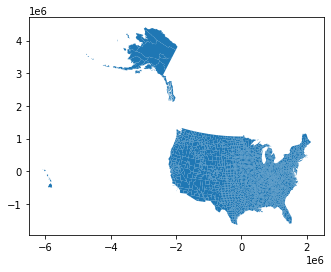

In [28]:
us.plot()

In [29]:
us.geometry.name

'geometry'

In [30]:
us = us.rename(columns={'geometry': 'borders'}).set_geometry('borders')
us.geometry.name

'borders'

In [31]:
us['centroid_column'] = us.centroid

In [32]:
us = us.set_geometry('centroid_column')

<AxesSubplot:>

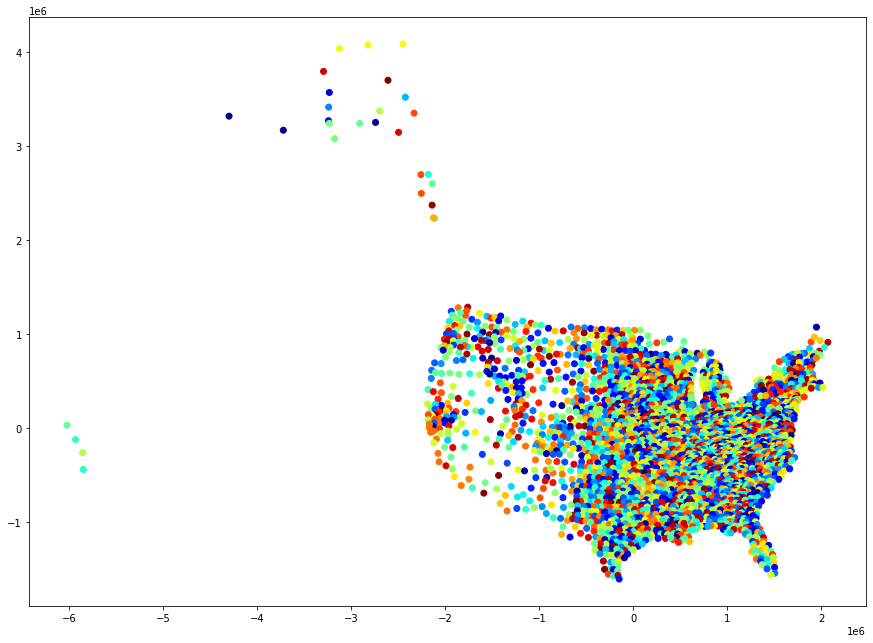

In [39]:
us.plot(cmap = 'jet', column = "NAME", figsize = (15,15))

In [40]:
gpd.options

Options(
  display_precision: None [default: None]
      The precision (maximum number of decimals) of the coordinates in the
      WKT representation in the Series/DataFrame display. By default (None),
      it tries to infer and use 3 decimals for projected coordinates and 5
      decimals for geographic coordinates.
  use_pygeos: False [default: False]
      Whether to use PyGEOS to speed up spatial operations. The default is
      True if PyGEOS is installed, and follows the USE_PYGEOS environment
      variable if set.
  )

In [41]:
us['centroid_column'].head()

0       POINT (76188.659 1036011.433)
1    POINT (-1557754.891 1185814.577)
2    POINT (-1514788.915 1166603.860)
3    POINT (-1638177.403 1215661.762)
4    POINT (-1471560.355 1173236.426)
Name: centroid_column, dtype: geometry

In [43]:
gpd.options.display_precision = 9
us['centroid_column'].head()

0       POINT (76188.659184489 1036011.433125230)
1    POINT (-1557754.890640871 1185814.576846840)
2    POINT (-1514788.915313977 1166603.859726191)
3    POINT (-1638177.402881016 1215661.762104609)
4    POINT (-1471560.355333018 1173236.426023904)
Name: centroid_column, dtype: geometry

# Reading and Writing Files

In [44]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import fiona as fio

<AxesSubplot:>

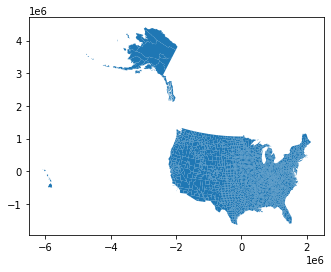

In [48]:
us = gpd.read_file(r"C:\Users\wtdud\Geopandas\TN.gdb", layer = 'county')
us.plot()

In [64]:
gdf_mask = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
gdf = gpd.read_file(gpd.datasets.get_path("naturalearth_cities"),
                    mask = gdf_mask[gdf_mask.continent=="Asia"])

<AxesSubplot:>

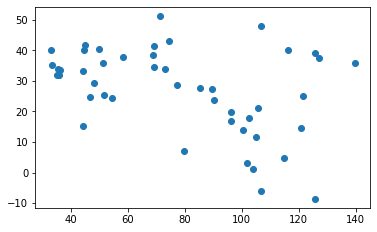

In [65]:
gdf.plot()

In [73]:
df = gpd.read_file((r"C:\Users\wtdud\Geopandas\TN.gdb\county.shp"), rows = 10)
df

,NAME,STATE_NAME,STATE_FIPS,CNTY_FIPS,FIPS,AREA,POP1990,POP1999,POP90_SQMI,HOUSEHOLDS,...,UNITS2,UNITS3_9,UNITS10_49,UNITS50_UP,MOBILEHOME,NO_FARMS87,AVG_SIZE87,CROP_ACR87,AVG_SALE87,geometry
0,Lake of the Woods,Minnesota,27,077,27077,1784.0634,4076,4597,2,1576,...,24,29,80,0,937,222,536,83787,27958,"POLYGON ((45826.358737904 1009373.235857589, 4..."
1,Ferry,Washington,53,019,53019,2280.2319,6295,7150,3,2247,...,40,51,44,0,936,218,3489,29482,22155,POLYGON ((-1594929.668232418 1132044.782680288...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8,Glacier,Montana,30,035,30035,3124.4572,12121,12524,4,3816,...,226,212,149,0,815,405,4065,484202,85215,POLYGON ((-1124517.614962670 1096537.709006172...
9,Toole,Montana,30,101,30101,1943.2598,5046,4653,3,1922,...,47,121,84,0,341,393,2879,671593,74509,POLYGON ((-1076989.416160780 1058276.047822592...


In [83]:
# combined a few steps here
df = gpd.read_file((r"C:\Users\wtdud\Geopandas\TN.gdb\county.shp"), rows = slice(10, 30), 
                   ignore_fields=["POP1990", "POP1999"],
                  ignore_geometry=True)
df

,NAME,STATE_NAME,STATE_FIPS,CNTY_FIPS,FIPS,AREA,POP90_SQMI,HOUSEHOLDS,MALES,FEMALES,...,UNITS_1ATT,UNITS2,UNITS3_9,UNITS10_49,UNITS50_UP,MOBILEHOME,NO_FARMS87,AVG_SIZE87,CROP_ACR87,AVG_SALE87
0,Liberty,Montana,30,051,30051,1485.9458,2,788,1120,1175,...,8,21,11,50,0,181,295,3167,-99,97342
1,Hill,Montana,30,041,30041,2917.3611,6,6426,8788,8866,...,70,320,674,310,86,1052,713,2415,1136593,76698
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18,Bonner,Idaho,16,017,16017,1902.6247,14,10269,13231,13391,...,230,232,609,399,0,2672,516,265,46034,10645
19,Ward,North Dakota,38,101,38101,2043.8348,28,21485,28824,29097,...,2584,1058,2212,1974,276,2511,1215,977,932154,38669


In [86]:
countries_gdf = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
countries_gdf.to_file("countries.shp")

# Indexing and Selecting Data

In [88]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

In [89]:
us = gpd.read_file(r"C:\Users\wtdud\Geopandas\TN.gdb\county.shp")

In [90]:
southern_states = us.cx[:, :0]

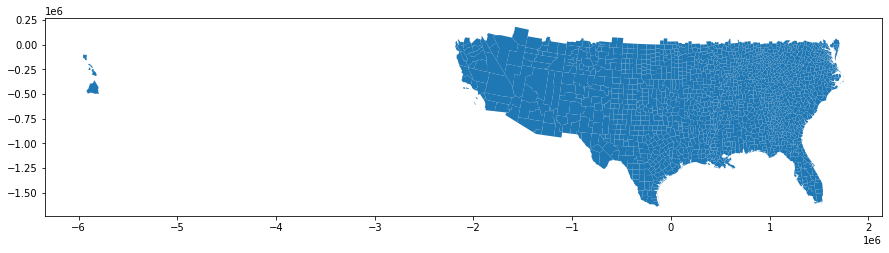

In [94]:
southern_states.plot(figsize = (15,5));

# Mapping and Plotting Tools

In [128]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

<AxesSubplot:>

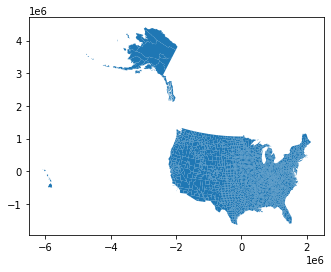

In [129]:
us = gpd.read_file(r"C:\Users\wtdud\Geopandas\TN.gdb\county.shp")
us.plot()

In [130]:
us.head()

,NAME,STATE_NAME,STATE_FIPS,CNTY_FIPS,FIPS,AREA,POP1990,POP1999,POP90_SQMI,HOUSEHOLDS,...,UNITS2,UNITS3_9,UNITS10_49,UNITS50_UP,MOBILEHOME,NO_FARMS87,AVG_SIZE87,CROP_ACR87,AVG_SALE87,geometry
0,Lake of the Woods,Minnesota,27,077,27077,1784.0634,4076,4597,2,1576,...,24,29,80,0,937,222,536,83787,27958,"POLYGON ((45826.358737904 1009373.235857589, 4..."
1,Ferry,Washington,53,019,53019,2280.2319,6295,7150,3,2247,...,40,51,44,0,936,218,3489,29482,22155,POLYGON ((-1594929.668232418 1132044.782680288...
2,Stevens,Washington,53,065,53065,2529.9794,30948,39965,12,11241,...,133,324,264,0,3264,1073,490,131700,18138,POLYGON ((-1495568.871681877 1119855.240511443...
3,Okanogan,Washington,53,047,53047,5306.1800,33350,38596,6,12654,...,346,816,286,0,3431,1476,907,144053,71970,POLYGON ((-1603467.191021759 1132885.585276471...
4,Pend Oreille,Washington,53,051,53051,1445.0286,8915,11788,6,3395,...,41,97,89,0,1185,227,276,22923,10367,POLYGON ((-1470317.683737115 1229524.004463620...


<AxesSubplot:>

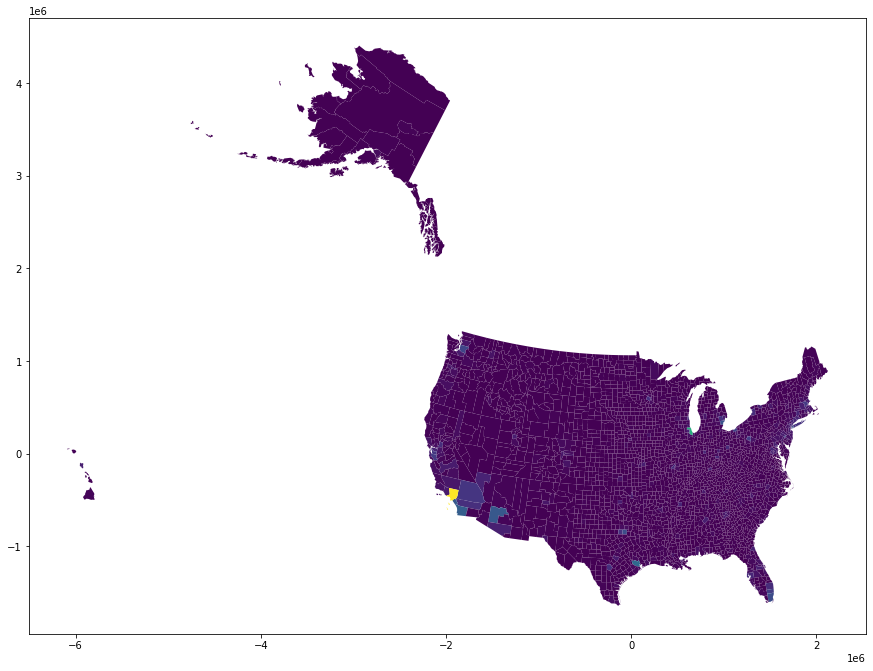

In [131]:
us.plot(column='HOUSEHOLDS', figsize=(15,15))

In [120]:
# I'm too stupid to try to remove hawaii and alaska but here is my attempt
filt = df["STATE_NAME"] == "Hawaii", "Alaska"
df = df.drop(index=df[filt].index)

TypeError: '(0     False
1     False
      ...  
18    False
19    False
Name: STATE_NAME, Length: 20, dtype: bool, 'Alaska')' is an invalid key

<AxesSubplot:>

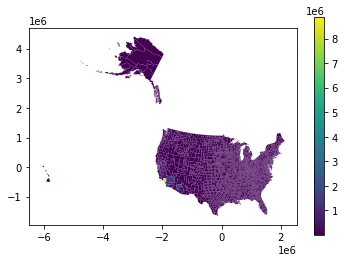

In [133]:
fig, ax = plt.subplots(1,1)
us.plot(column='POP1990', ax=ax, legend=True)

In [134]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

<AxesSubplot:>

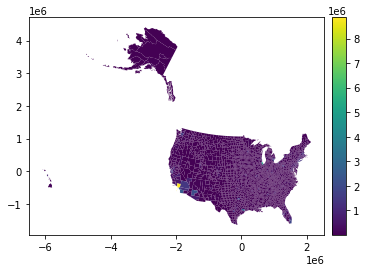

In [136]:
fig, ax = plt.subplots(1, 1)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
us.plot(column='POP1990', ax=ax, legend=True, cax=cax)

<AxesSubplot:>

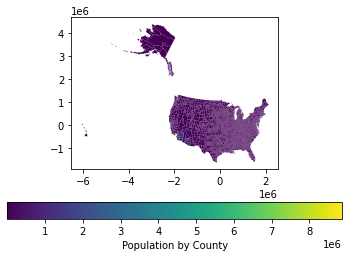

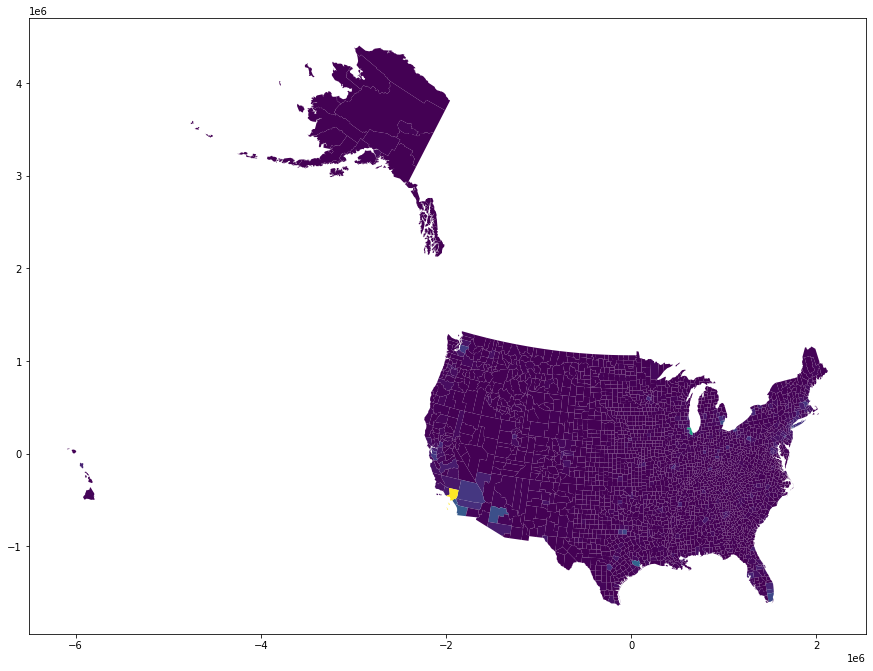

In [151]:
# I attempted to enlarge the all of the map but I could only get it to enlarge the legend within the syntax
fig, ax = plt.subplots(1, 1)
us.plot(column="POP1990",ax=ax, legend=True, legend_kwds={'label': "Population by County", 
                                                          'orientation':"horizontal"})
us.plot(column="POP1990", figsize=(15,15))

<AxesSubplot:>

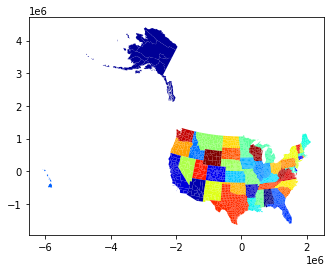

In [153]:
us.plot(column="STATE_NAME", cmap = "jet")

<AxesSubplot:>

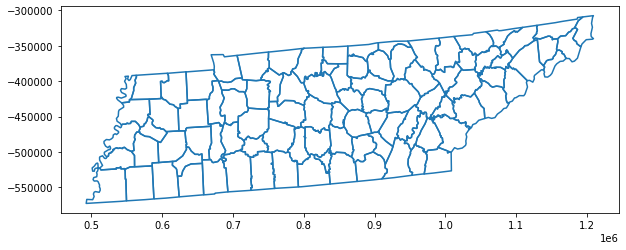

In [158]:
tn = us[us["STATE_NAME"] == "Tennessee"]
tn.boundary.plot("", figsize=(10,10))

C:\Users\wtdud\anaconda3\envs\geo_env\lib\site-packages\pandas\core\indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


<AxesSubplot:>

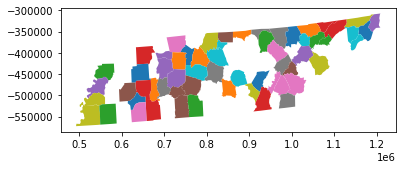

In [163]:
# Error is showing up because I used the us dataframe example before this. Still recieved the correct output
import numpy as num
tn.loc[num.random.choice(tn.index, 20), "NAME"] = num.nan
tn.plot(column="NAME")

<AxesSubplot:>

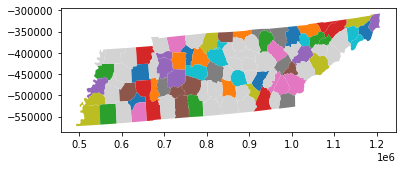

In [164]:
tn.plot(column='NAME', missing_kwds={'color': 'lightgrey'})

<AxesSubplot:>

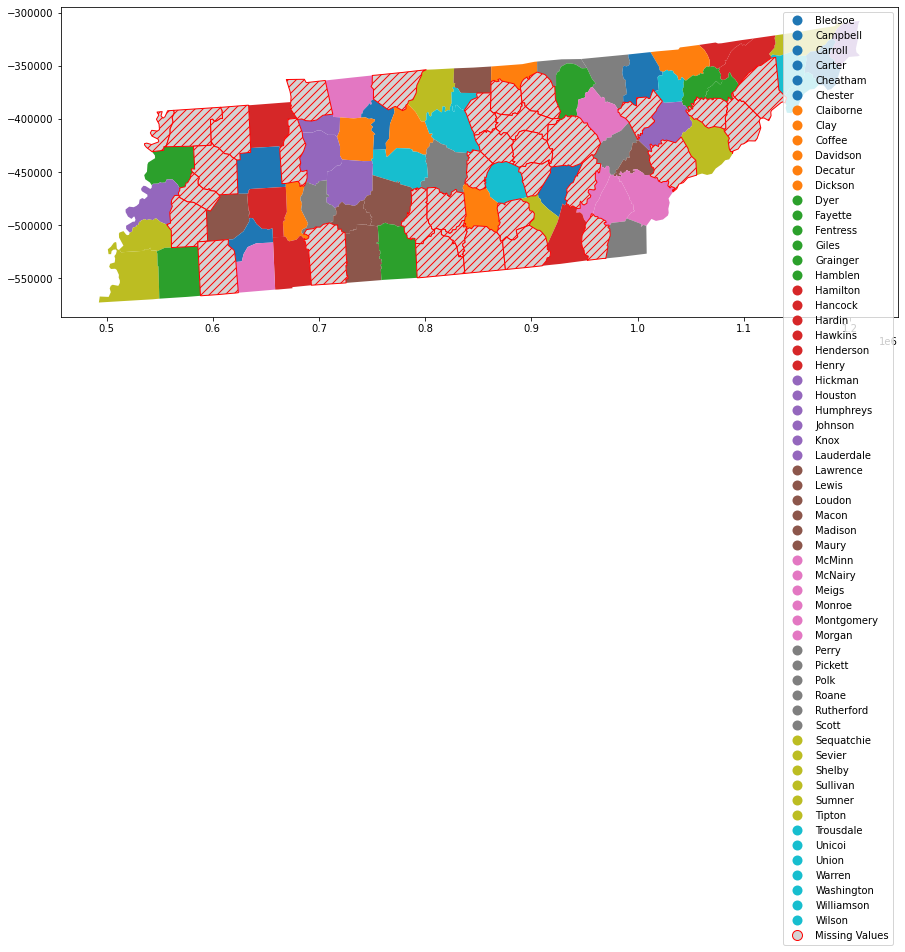

In [165]:
tn.plot(column="NAME", legend=True, figsize=(15,10), missing_kwds={"color":"lightgrey",
                                                                  "edgecolor":"red",
                                                                  "hatch":"///",
                                                                  "label":"Missing Values"})

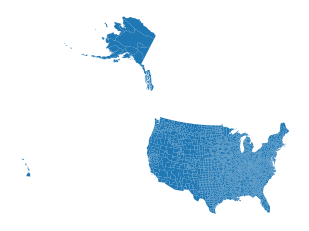

In [166]:
ax = us.plot()
ax.set_axis_off()

In [172]:
TNshp = gpd.read_file(r"C:\Users\wtdud\Geopandas\TN.gdb\TN.shp")

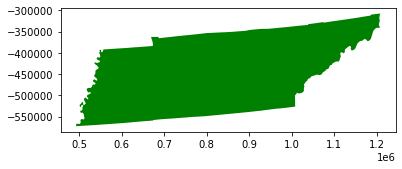

In [176]:
TNshp.plot(marker="*", color="green")
TNshp = TNshp.to_crs(us.crs)

<AxesSubplot:>

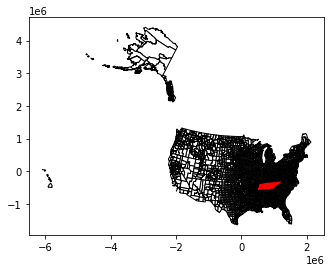

In [179]:
base = us.plot(color="white", edgecolor="black")
TNshp.plot(ax=base, color="red")

<AxesSubplot:>

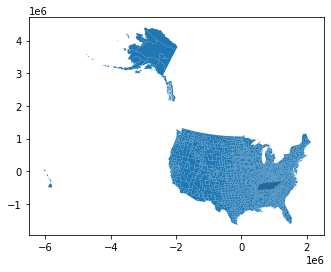

In [183]:
ax = tn.plot(color='k')
us.plot(ax=ax)

<AxesSubplot:>

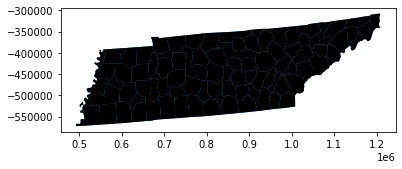

In [187]:
ax = tn.plot(color="k", zorder=2)
tn.plot(ax=ax, zorder=1)

In [188]:
tn.head(10)

,NAME,STATE_NAME,STATE_FIPS,CNTY_FIPS,FIPS,AREA,POP1990,POP1999,POP90_SQMI,HOUSEHOLDS,...,UNITS2,UNITS3_9,UNITS10_49,UNITS50_UP,MOBILEHOME,NO_FARMS87,AVG_SIZE87,CROP_ACR87,AVG_SALE87,geometry
1802,NaN,Tennessee,47,161,47161,498.2390,9479,11844,19,3678,...,53,52,55,0,983,371,150,23231,8162,"POLYGON ((673413.382992105 -384006.882854265, ..."
1804,NaN,Tennessee,47,147,47147,493.9054,41494,54755,84,14801,...,601,535,263,54,1977,1543,165,187863,28112,"POLYGON ((783512.733037588 -385636.942945790, ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1814,Johnson,Tennessee,47,091,47091,305.7695,13766,16906,45,5406,...,89,206,90,0,1227,888,70,28001,6940,"POLYGON ((1205441.278885124 -333736.942501858,..."
1816,Scott,Tennessee,47,151,47151,535.0492,18358,20269,34,6534,...,128,281,96,0,1480,239,145,12939,17662,"POLYGON ((986483.599341818 -384110.423089712, ..."


<AxesSubplot:xlabel='MOBILEHOME', ylabel='POP1999'>

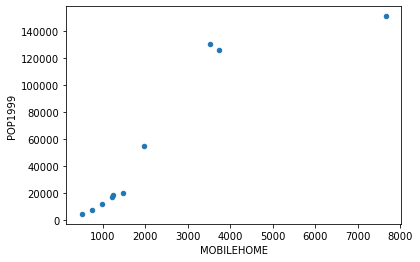

In [192]:
# Bar graph does not work well with this data
gdf = tn.head(10)
gdf.plot(kind='scatter', x="MOBILEHOME", y="POP1999")

# Interactive Mapping

In [193]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

In [197]:
shelby = gpd.read_file(r"C:\Users\wtdud\Geopandas\Shelby.gdb\Shelby.gdb", layer="County_shelby")
parks = gpd.read_file(r"C:\Users\wtdud\Geopandas\Shelby.gdb\Shelby.gdb", layer="Parks_shelby")
hos = gpd.read_file(r"C:\Users\wtdud\Geopandas\Shelby.gdb\Shelby.gdb", layer="Hospital_shelby")

In [200]:
parks.explore(column="NAME",
             tooltip="NAME",
             popup=True,
             tiles="CartoDB positron",
             cmap="Set1",
             style_kwds=dict(color="black"))

In [201]:
import folium

In [204]:
m = parks.explore(column="NAME",
                   scheme="naturalbreaks",
                   legend=True,
                   k=10,
                   legend_kwds=dict(colorbar=False),
                   name="Parks")
hos.explore(m=m,
           color="red",
           marker_kwds=dict(radius=10, fill=True),
           tooltip="FACILITY_NAME",
           tooltip_kwds=dict(labels=False),
           name="hospitals")

In [205]:
folium.TileLayer('Stamen Toner', control=True).add_to(m)
folium.LayerControl().add_to(m)

# Managing Projections